# PyGLImER Demo Notebook

## 1. Downloading and preprocess the raw data (10 years of receiver functions from Station `IU.HRV`)


### 1.1. Define input parameters for download and preprocessing

In [1]:
import os
from obspy import UTCDateTime

# Get notebook path for future reference of the database:
try: ipynb_path
except NameError: ipynb_path = os.getcwd()

# Define file locations
database     = os.path.join(ipynb_path,"database")
event_cat    = os.path.join(database, "events")
station_cat  = os.path.join(database, "stations")
waveform_cat = os.path.join(database, "waveforms")
preproc_cat  = os.path.join(database, "preprocessed")
rf_cat       = os.path.join(database, "RF")

request_dict = {
    # Necessary arguments
    "phase": "P",               # 'P' or 'S' receiver functions
    "rot": "PSS",               # Coordinate system to rotate to
    "evtloc": event_cat,        # Directory of the events
    "statloc": station_cat,     # Directory of the stations
    "rawloc": waveform_cat,     # Directory of the waveforms
    "preproloc": preproc_cat,   # Directory of the preprocessed waveforms
    "rfloc": rf_cat,            # Directory of the receiver functions
    "deconmeth": "waterlevel",  # Deconvolution method
    "starttime": UTCDateTime(2010, 1, 1, 0, 0, 0),      # Starttime of database
    "endtime": UTCDateTime(2020, 8, 4, 6, 0, 0),   # Endtimetime of database
    # kwargs below
    "wavdownload": True,         # Download flag 
    "pol": 'v',                  # Source wavelet polaristion. Def. "v" --> SV
    "minmag": 5.9,               # Earthquake minimum magnitude. Def. 5.5
    "event_coords": None,        # Specific event?. Def. None
    "network": "IU",             # Restricts networks. Def. None
    "station": "HRV",            # Restricts stations. Def. None
    "waveform_client": ["IRIS"], # FDSN server client (s. obspy). Def. None
    "re_client": ['IRIS'],       # irrelevant for normal use
    "evtcat": None,              # Use existing `obspy.catalog`
    "debug": False               # False
}

### 1.2. Get event data.
In this step, information about all events located inside of `event_coords` with a magnitude above `minmag` is obtained

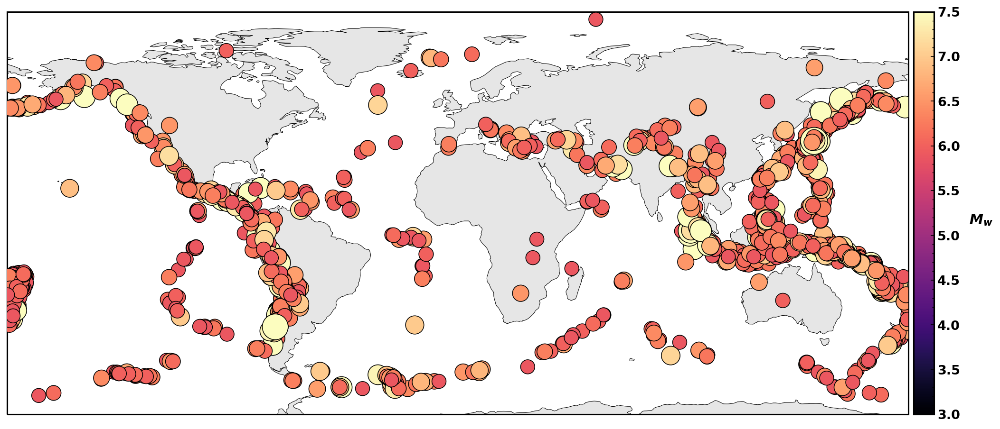

In [9]:
from pyglimer.waveform.request import Request
from pyglimer.plot.plot_utils import set_mpl_params
from pyglimer.plot.plot_utils import plot_catalog
set_mpl_params()
R = Request(**request_dict)
plot_catalog(R.evtcat)

### 1.3. Getting the waveform data
`R.download_waveforms()` first finds all stations in a given distance range (i.e., sensible for the receiver function technique) from each event. Subsequently, it downloads the station response and the raw waveform 120 seconds around the theoretical arrival of the teleseismic phase for those stations.

In [3]:
R.download_waveforms()
print("Number of downloaded waveforms:")
!ls database/waveforms/{request_dict['phase']}/**/*.mseed | wc -l

[2020-11-11 11:06:52,934] - obspy.clients.fdsn.mass_downloader - INFO: Initializing FDSN client(s) for IRIS.
[2020-11-11 11:06:54,152] - obspy.clients.fdsn.mass_downloader - INFO: Successfully initialized 1 client(s): IRIS.
Number of downloaded waveforms:
775


### Plot one raw waveform (using obspy)
We can plot waveform data using obspy (Krischer et. al., 2015) (PyGLImER's main dependency).

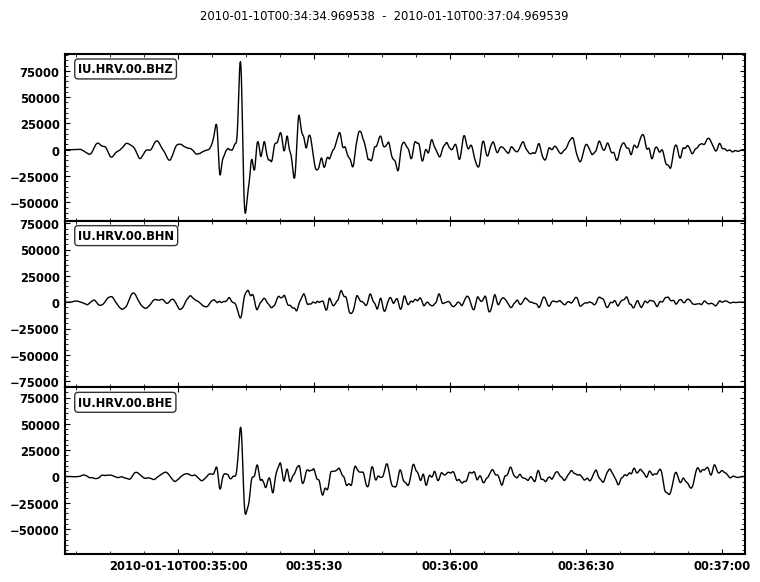

In [4]:
from obspy import read
st = read('database/waveforms/P/2010010T002740_40.5_-124.5/IU.HRV.mseed')
st.plot(size=(800,600),show=False)

### 1.4. Preprocess and deconvolve downloaded waveforms
``R.preprocess()`` comprises the following steps:
1. Tapering, demeaning, and detrending the data.
2. Casting the waveform into the Radial-transverse-Vertical coordinate system.
3. First bandpass filter.
4. Quality Control; noisy data is discarded and flagged in this step.
5. (Optional) If the user chose to cast the waveform into the L-Q-T or P-Sv-Sh coordinate system, this will be done now. In this example, `rot` is set `="PSS"`.
6. Deconvolution. Currently, the following options are available: iterative time domain deconvolution (Ligorria & Ammon, 1999), extended-time multitaper frequency domain cross-correlation (Helffrich, 2006), and various approaches base on a spectral devision - as for example waterlevel spectral division (Clayton & Wiggins, 1976).
Finally, we will plot all created receiver functions with a section plot implemented into PyGLImER. The way receiver function objects are handled is akin to rf by Eulenfeld (2020).

Download and preprocessing finished.
Number of RFs:  240


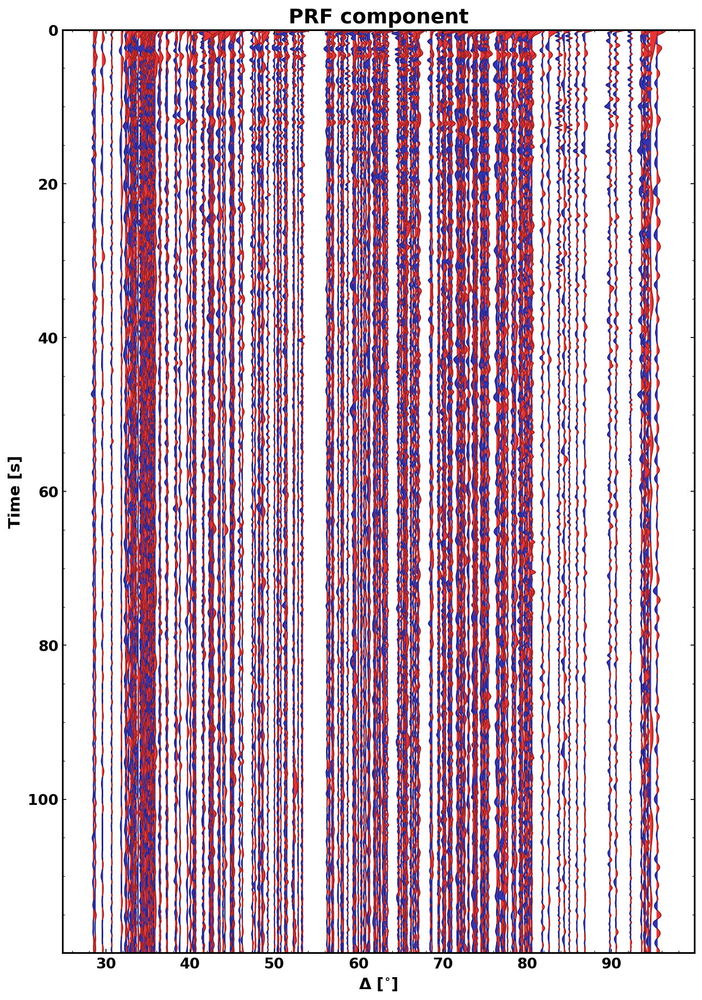

In [5]:
R.preprocess()
from pyglimer.rf.create import read_rf
rfst = read_rf("database/RF/P/IU/HRV/*.sac")
print("Number of RFs: ", len(rfst))
ax = rfst.plot()

## 2. Depth-migrated Single Station Stacks
The receiver functions computed above are given in time domain. To migrate them to depth domain, the receiver function object contains a `rf.moveout()` function. Alternatively, we can use `rf.station_stack` to migrate the functions to depth domain and, afterwards, stack all of them. Here, the 1-D migration process is done using the iasp91 model (Kennett & Engdahl, 1991). The more complex GyPSuM model (Simmons et. al., 2010) can be used by setting the ``vmodel='3D'`` flag.

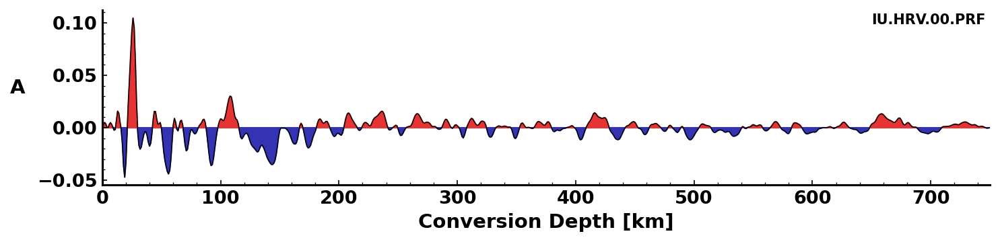

In [6]:
from pyglimer.rf import read_by_station
hrv = read_by_station('IU','HRV','P','database/RF')
_,stack,_ = hrv.station_stack()
ax = stack.plot()

## 3. CCP Stack (from one station)
PyGLImER supports binning and stacking by common conversion points. The binning is done using a new, particularly efficient algorithm (this will be discussed in detail in a seperate publication). CCP stacks are computed using the ``init_ccp()`` method, which takes flags for the bin distance and the velocity model used for the depth-migration (see above). For illustration, we will compute a stack of the data processed before.

In [7]:
from pyglimer.ccp import init_ccp
ccp = init_ccp(.25,'iasp91.dat','P',statloc='database/stations',preproloc='database/preprocessed',rfloc='database/RF',network='IU',station='HRV',compute_stack=True,save='ccp.pkl')
ccp.conclude_ccp(keep_water=True)

  0%|          | 0/24 [00:00<?, ?it/s]

Number of receiver functions used: 240
Number of cores used: 8
Available system memory: 16633.425919999998MB


100%|██████████| 24/24 [00:14<00:00,  1.61it/s]


Stacking finished.


### CCP object in map view
CCP objects can be visualised in several manners. For a general overview, one can use the ``map_plot()`` method, which will also plot eachs bin's illumination.

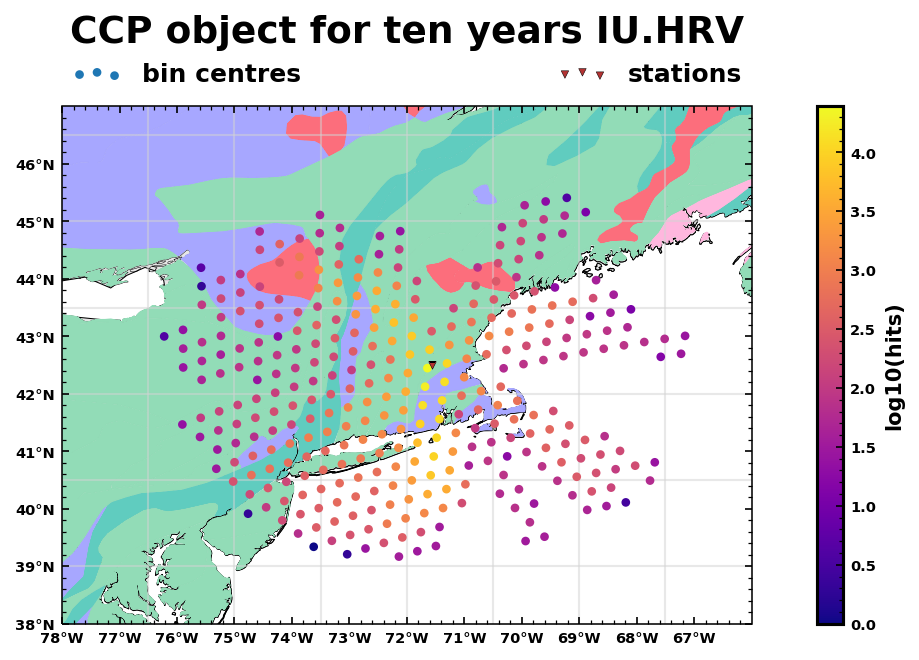

In [8]:
ccp.map_plot(plot_stations=True,plot_illum=True,geology=True, title='CCP object for ten years IU.HRV')

### Plotting Slices of CCP stack
A static plot of three slices (normal to z, lat, and lon direction, respectively) can be created using the ``ccp.plot_volume_sections()`` method. An interactive method to explore CCP volumes is currently under development. At the time, one can use a previous exploration toolset in Matlab (Rondenay et. al., 2020) as shown in a seperate video.

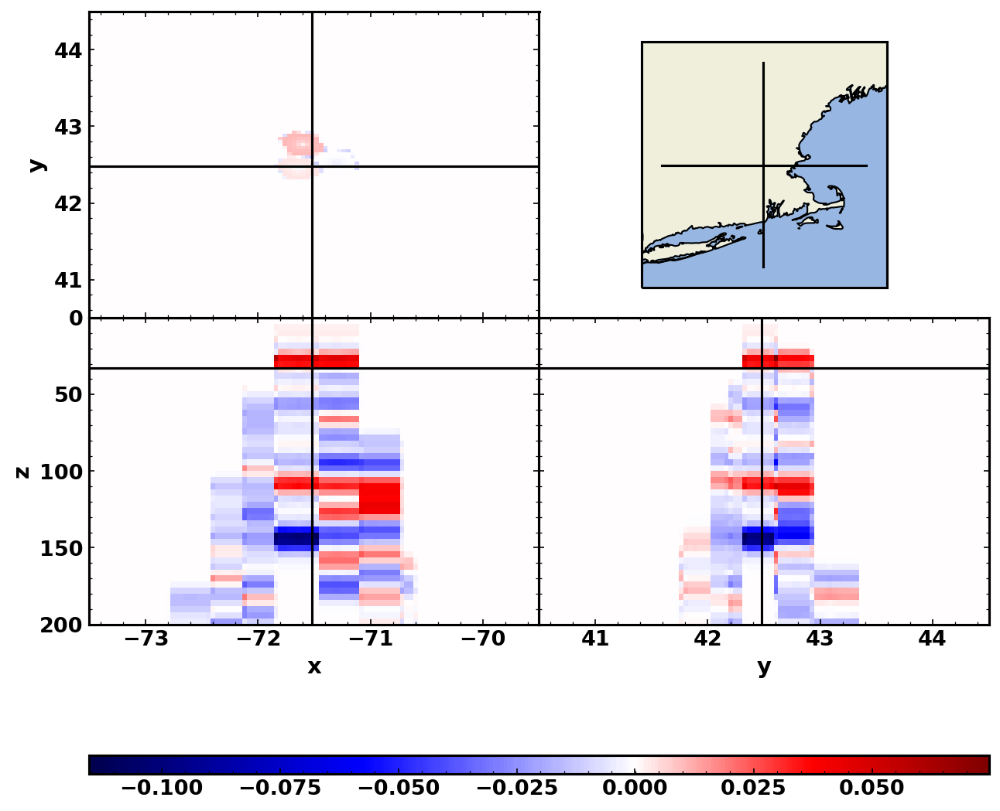

In [8]:
import numpy as np
lon = np.linspace(-73.5,-69.5,100)
lat = np.linspace(40.5,44.5,100)
z = np.linspace(0,200)
ccpplot = ccp.plot_volume_sections(lon,lat,z,zsl=34)

# References
Clayton, R. W., & Wiggins, R. A. (1976). Source shape estimation and deconvolution of teleseismic bodywaves. Geophysical Journal International, 47(1), 151-177.

Eulenfeld, T. (2020). rf: Receiver function calculation in seismology. Journal of Open Source Software, 5(48), 1808.

Helffrich, G. (2006). Extended-time multitaper frequency domain cross-correlation receiver-function estimation. Bulletin of the Seismological Society of America, 96(1), 344-347.

Kennett, B. L. N., & Engdahl, E. R. (1991). Traveltimes for global earthquake location and phase identification. Geophysical Journal International, 105(2), 429-465.

Krischer, L., Megies, T., Barsch, R., Beyreuther, M., Lecocq, T., Caudron, C., & Wassermann, J. (2015). ObsPy: A bridge for seismology into the scientific Python ecosystem. Computational Science & Discovery, 8(1), 014003.

Ligorria, J. P., & Ammon, C. J. (1999). Iterative deconvolution and receiver-function estimation. Bulletin of the seismological Society of America, 89(5), 1395-1400.

Rondenay, S., Sawade, L., and Makus, P.: GLImER: a MATLAB-based tool to image global lithospheric structure, EGU General Assembly 2020, Online, 4–8 May 2020, EGU2020-22607, https://doi.org/10.5194/egusphere-egu2020-22607, 2020.

Simmons, N. A., Forte, A. M., Boschi, L., & Grand, S. P. (2010). GyPSuM: A joint tomographic model of mantle density and seismic wave speeds. Journal of Geophysical Research: Solid Earth, 115(B12).